# Face Identification Using MTCNN
This notebook uses [MTCNN](https://github.com/ipazc/mtcnn) face detector.


## Prerequesites
Install the mtcnn library using
```
!pip install mtcnn
```


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import cv2
import tensorflow as tf
import numpy as np
from mtcnn import MTCNN
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import preprocessor
import configuration
import glob
import random
import time
import statistics
import viz

preproc = preprocessor.PreProcessor()
config = configuration.Configuration()
vizualizer = viz.Vizualizer()

In [4]:
def infer(ax, model, image_file):
    # preparer = preprocessor.PreProcessor()
    # image = preparer.increase_brightness(cv2.imread(image_file), 50)
    # Sample prediction output:
    # {
    #     'box': [277, 90, 48, 63],
    #     'keypoints':
    #     {
    #         'nose': (303, 131),
    #         'mouth_right': (313, 141),
    #         'right_eye': (314, 114),
    #         'left_eye': (291, 117),
    #         'mouth_left': (296, 143)
    #     },
    #     'confidence': 0.99851983785629272
    # }
    
    image = cv2.cvtColor(cv2.imread(image_file), cv2.COLOR_BGR2RGB)
    
    start = time.process_time()
    predictions = model.detect_faces(image)
    time_taken = time.process_time() - start
    for prediction in predictions:
        bounding_box = prediction['box']
        confidence = prediction['confidence']
        if confidence > 0.6 and len(bounding_box) > 0:
            [x,y,w,h] = bounding_box
            rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
    ax.imshow(image)
    # ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    return time_taken
    

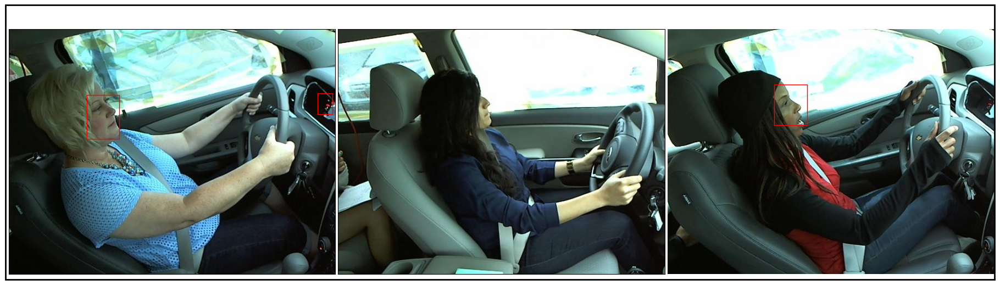

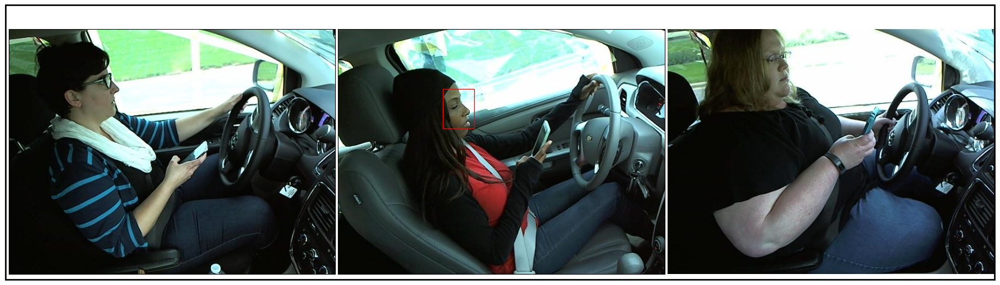

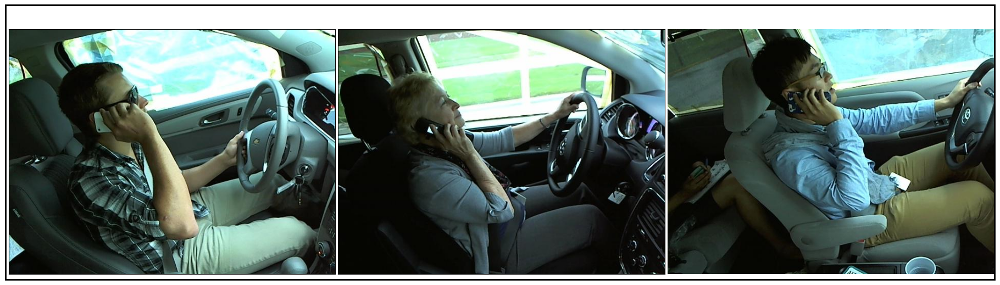

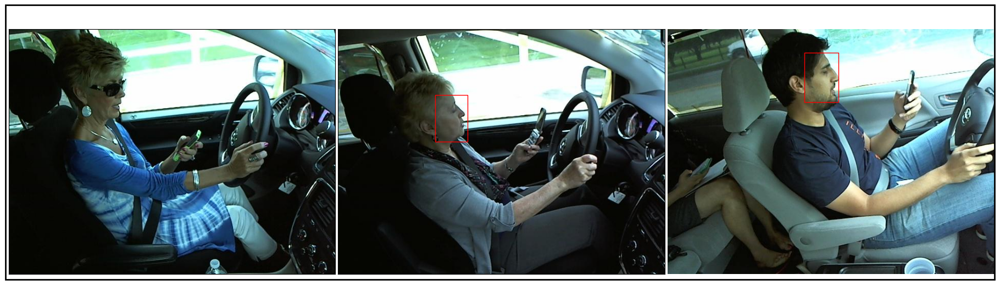

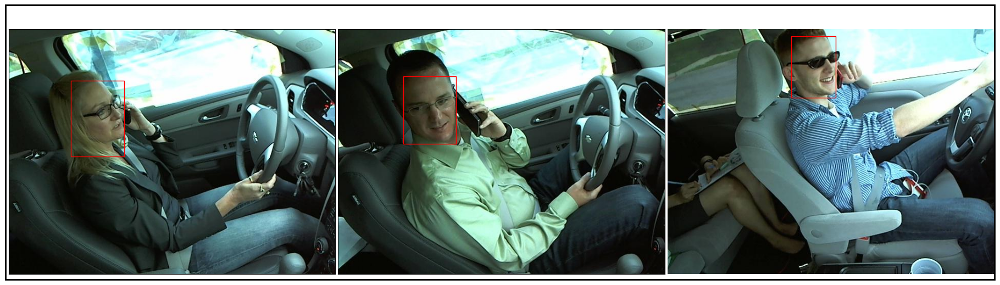

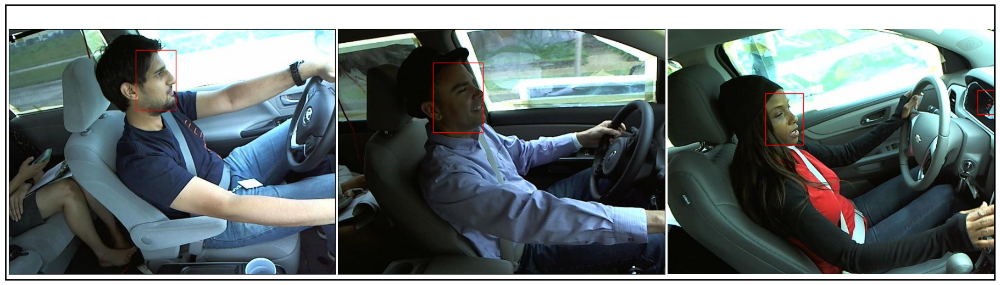

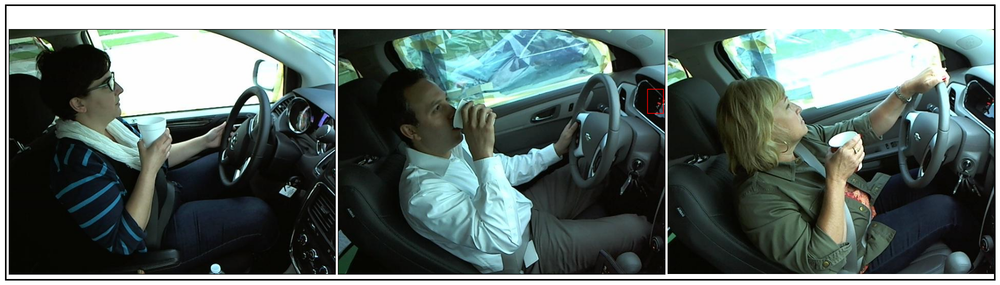

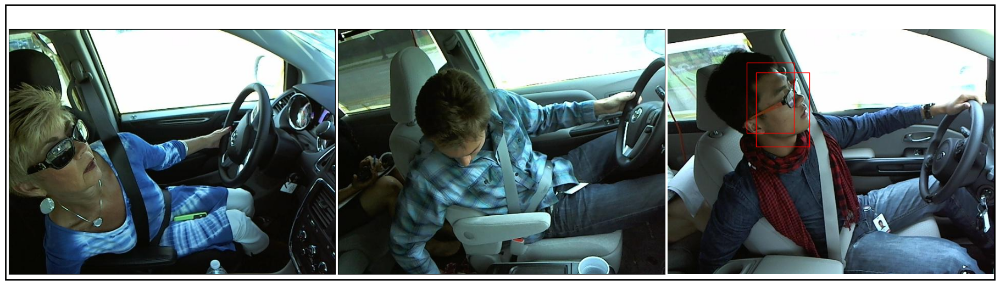

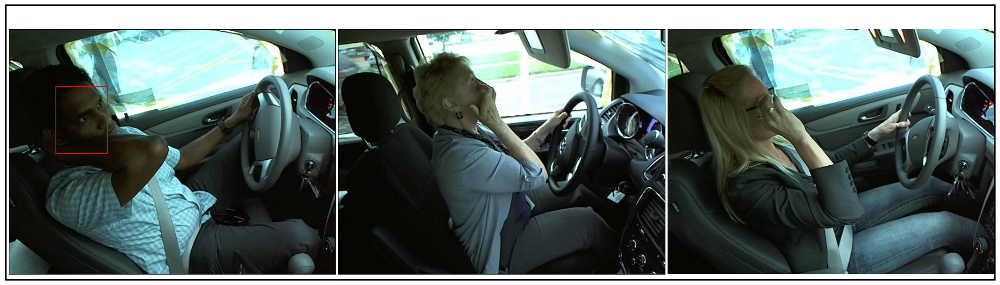

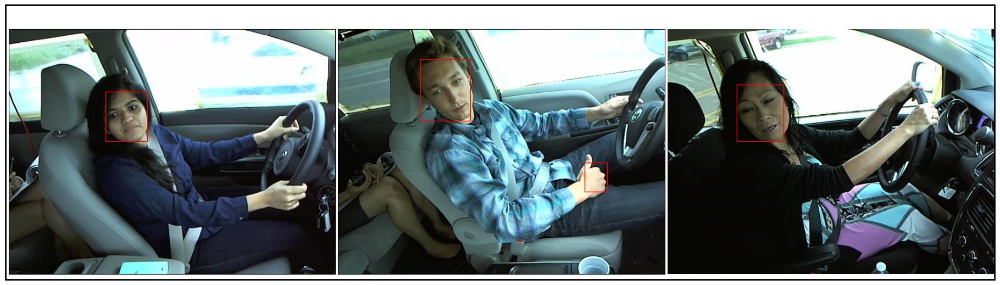

Average time for inference:0.7461320999999995 seconds
Anticipated preprocessing time for training dataset of 22,000:273.58176999999984 mins


In [6]:
model = MTCNN()
times = []
for cur_class in range(len(config.class_dict)):
    times = [*times, *vizualizer.infer_and_plot(model, infer, config.class_dict[cur_class], f'{config.IMAGES_BASE}/c{cur_class}', num_images=3, cols=3, plt_width=18, plt_height=5)]

print(f'Average time for inference:{statistics.mean(times)} seconds')
print(f'Anticipated preprocessing time for training dataset of 22,000:{22000 * statistics.mean(times) / 60} mins')
